# Preprocessing 1GB Subset

In [1]:
import os
from collections import defaultdict

root_dir = "/kaggle/input/ucf-crime-dataset/Train"
classes = ["NormalVideos", "Abuse", "Assault", "Arrest", "Arson", "Burglary",
           "Explosion", "Fighting", "RoadAccidents", "Robbery", "Shooting",
           "Shoplifting", "Stealing", "Vandalism"]

In [2]:
from collections import defaultdict

video_dict = defaultdict(list)

for cls in os.listdir(root_dir):
    class_path = os.path.join(root_dir, cls)
    if not os.path.isdir(class_path):
        continue
    for f in sorted(os.listdir(class_path)):
        if f.endswith(".png"):
            # Group by video name prefix: remove "_###.png"
            # prefix = "_".join(f.split("_")[:4])
            prefix = "_".join(f.split("_")[:-1])
            video_dict[(cls, prefix)].append(os.path.join(class_path, f))

print(f"Total grouped videos: {len(video_dict)}")


Total grouped videos: 1610


In [3]:
# DEBUG: Check a few keys and their lengths
for i, (k, v) in enumerate(video_dict.items()):
    print(f"{k} -> {len(v)} frames")
    if i == 10:
        break

('RoadAccidents', 'RoadAccidents003_x264') -> 149 frames
('RoadAccidents', 'RoadAccidents005_x264') -> 23 frames
('RoadAccidents', 'RoadAccidents006_x264') -> 170 frames
('RoadAccidents', 'RoadAccidents007_x264') -> 111 frames
('RoadAccidents', 'RoadAccidents008_x264') -> 133 frames
('RoadAccidents', 'RoadAccidents013_x264') -> 173 frames
('RoadAccidents', 'RoadAccidents014_x264') -> 1190 frames
('RoadAccidents', 'RoadAccidents015_x264') -> 135 frames
('RoadAccidents', 'RoadAccidents018_x264') -> 152 frames
('RoadAccidents', 'RoadAccidents023_x264') -> 351 frames
('RoadAccidents', 'RoadAccidents024_x264') -> 595 frames


In [4]:
import cv2
import numpy as np

def uniform_sample(frame_paths, num_samples=16):
    total = len(frame_paths)
    if total < num_samples:
        return []
    indices = np.linspace(0, total - 1, num_samples, dtype=int)
    return [frame_paths[i] for i in indices]

def load_frames(frame_paths):
    frames = []
    for path in frame_paths:
        img = cv2.imread(path)
        if img is not None:
            img = cv2.resize(img, (224, 224))
            frames.append(img)
    return frames

In [5]:
import torch

def preprocess_frames(frames):
    frames = np.stack(frames) / 255.0  # (16, 224, 224, 3)
    frames = frames.transpose(0, 3, 1, 2)  # (16, 3, 224, 224)
    return torch.tensor(frames, dtype=torch.float32)

In [21]:
subset_data = []
labels = []

class_to_idx = {cls: idx for idx, cls in enumerate(sorted(os.listdir(root_dir)))}

for cls in class_to_idx:
    count = 0
    for (video_cls, vid_id), frame_list in video_dict.items():
        if video_cls != cls:
            continue
        if count >= 30:
            break
        if len(frame_list) < 16:
            continue
        sampled_paths = uniform_sample(frame_list, num_samples=16)
        frames = load_frames(sampled_paths)
        if len(frames) == 16:
            tensor = preprocess_frames(frames)
            subset_data.append(tensor)
            labels.append(class_to_idx[cls])
            count += 1

print(f"✅ Loaded {len(subset_data)} videos from all classes.")

✅ Loaded 415 videos from all classes.


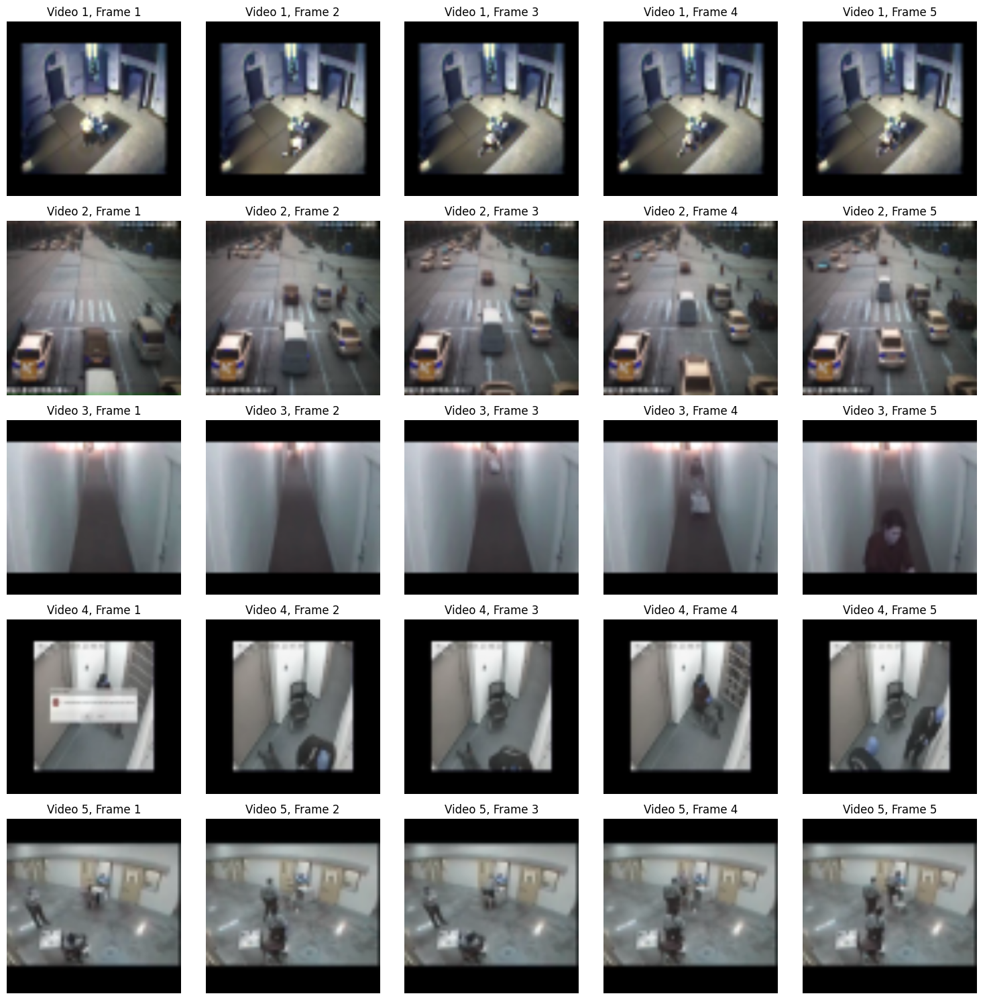

In [22]:
import matplotlib.pyplot as plt
import torch

# Function to plot 5 frames from each video
def plot_video_frames(subset_data, num_videos=5, num_frames=5):
    fig, axes = plt.subplots(num_videos, num_frames, figsize=(15, 15))
    for i in range(num_videos):
        video_tensor = subset_data[i]  # Each element is a video's tensor (16 frames)
        for j in range(num_frames):
            frame = video_tensor[j]  # Extract the j-th frame from the video
            axes[i, j].imshow(frame.permute(1, 2, 0).cpu().numpy())  # Convert tensor to HWC for image display
            axes[i, j].axis('off')
            axes[i, j].set_title(f'Video {i + 1}, Frame {j + 1}')
    plt.tight_layout()
    plt.show()

# Show 5 videos with 5 frames each
plot_video_frames(subset_data)

In [23]:
import torch
from torch.utils.data import TensorDataset, DataLoader

# Stack tensors
X = torch.stack(subset_data)  # Shape: (N, T, C, H, W)
y = torch.tensor(labels, dtype=torch.long)

# Create dataset and loader
dataset = TensorDataset(X, y)
loader = DataLoader(dataset, batch_size=4, shuffle=True)

In [24]:
print(loader)

In [25]:
import torch_xla
import torch_xla.core.xla_model as xm

device = xm.xla_device()
print("TPU Device:", device)

TPU Device: xla:0


In [26]:
import torch_xla
import torch_xla.core.xla_model as xm

device = xm.xla_device()
X = X.to(device)
y = y.to(device)

In [27]:
# from torch.utils.data import TensorDataset, DataLoader, random_split

# # Combine into dataset
# # full_dataset = TensorDataset(torch.stack(subset_data), torch.tensor(labels))

# # Split sizes
# total_size = len(loader)
# val_size = test_size = int(0.15 * total_size)
# train_size = total_size - val_size - test_size

# # Split
# train_dataset, val_dataset, test_dataset = random_split(loader, [train_size, val_size, test_size])

# # Create loaders
# train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=8)
# test_loader = DataLoader(test_dataset, batch_size=8)


In [47]:
# train_loader

Device: xla:0, xla:0


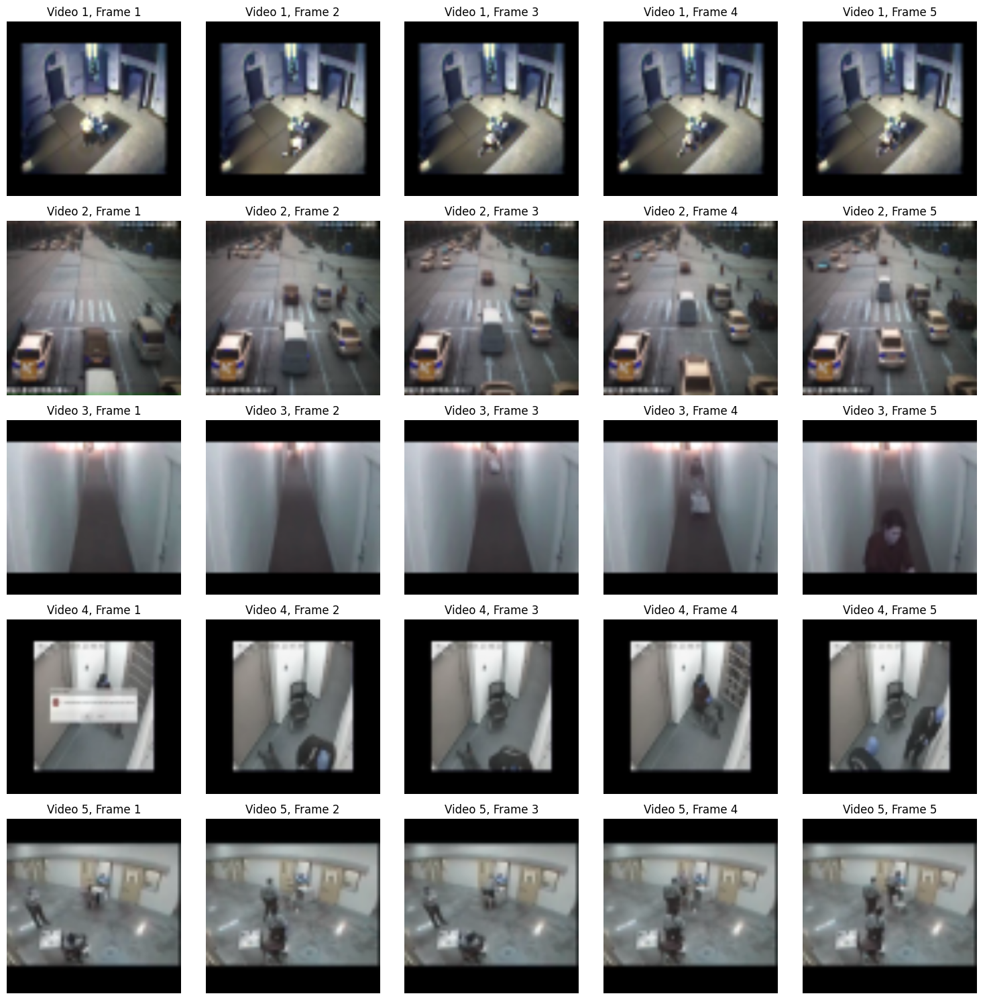

In [51]:
import torch
import matplotlib.pyplot as plt

# Check if tensors are moved to the XLA device
print(f"Device: {X.device}, {y.device}")

# Assuming X is a tensor representing video frames
def plot_video_frames_on_xla(X, num_videos=5, num_frames=5):
    fig, axes = plt.subplots(num_videos, num_frames, figsize=(15, 15))
    for i in range(num_videos):
        video_tensor = X[i]  # Each element is a video's tensor (16 frames)
        for j in range(num_frames):
            frame = video_tensor[j].cpu()  # Transfer frame back to CPU for visualization
            axes[i, j].imshow(frame.permute(1, 2, 0).numpy())  # Convert tensor to HWC for image display
            axes[i, j].axis('off')
            axes[i, j].set_title(f'Video {i + 1}, Frame {j + 1}')
    plt.tight_layout()
    plt.show()

# Show the first 5 videos with 5 frames each
plot_video_frames_on_xla(X)

In [52]:
for batch_x, batch_y in loader:
    print("Batch X shape:", batch_x.shape)  # Expected: (4, 16, 3, 224, 224)
    print("Batch Y:", batch_y)
    break

Batch X shape: torch.Size([4, 16, 3, 224, 224])
Batch Y: tensor([12, 13, 13, 12])


In [53]:
import torch.nn as nn

class CNN_LSTM(nn.Module):
    def __init__(self, num_classes=14):  # 14 classes in UCF-Crime
        super().__init__()
        # CNN for spatial features (2D)
        self.cnn = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 224 -> 112
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 112 -> 56
            nn.Flatten()
        )
        
        # LSTM for temporal features
        self.lstm = nn.LSTM(
            input_size=64 * 56 * 56,  # Adjust based on CNN output
            hidden_size=128,
            batch_first=True
        )
        
        # Classifier
        self.fc = nn.Linear(128, num_classes)

    def forward(self, x):
        # x shape: [B, T, C, H, W] (e.g., [4, 16, 3, 224, 224])
        B, T, C, H, W = x.shape
        # Process frames through CNN
        c_in = x.view(B * T, C, H, W)  # Merge batch and time
        c_out = self.cnn(c_in)          # [B*T, 64*56*56]
        r_in = c_out.view(B, T, -1)     # Unmerge for LSTM
        # Temporal modeling
        r_out, _ = self.lstm(r_in)      # [B, T, 128]
        # Classify using last timestep
        output = self.fc(r_out[:, -1, :])  # [B, num_classes]
        return output

In [54]:
model = CNN_LSTM().to(device)
print("Model device:", next(model.parameters()).device)

Model device: xla:0


In [55]:
# Check number of batches
print(f"Train loader size: {len(train_loader)} batches")


Train loader size: 10 batches


In [57]:
# data_iter = iter(train_loader)
# data = next(data_iter)

In [59]:
import torch_xla.distributed.parallel_loader as pl

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

def train_one_epoch(model, train_loader, optimizer, criterion, device):
    model.train()
    para_loader = pl.MpDeviceLoader(train_loader, device)
    total_loss = 0.0
    for batch_x, batch_y in para_loader:
        optimizer.zero_grad()
        output = model(batch_x)
        loss = criterion(output, batch_y)
        loss.backward()
        xm.optimizer_step(optimizer)  # TPU-specific step
        total_loss += loss.item()
    return total_loss / len(train_loader)

# Train for 5 epochs
for epoch in range(5):
    train_loss = train_one_epoch(model, loader, optimizer, criterion, device)
    print(f"Epoch {epoch+1}, Loss: {train_loss:.4f}")

Epoch 1, Loss: 2.7073
Epoch 2, Loss: 2.6675
Epoch 3, Loss: 2.6633
Epoch 4, Loss: 2.6684
Epoch 5, Loss: 2.6650


In [60]:
# train_one_epoch(model, train_loader, optimizer, criterion, device)

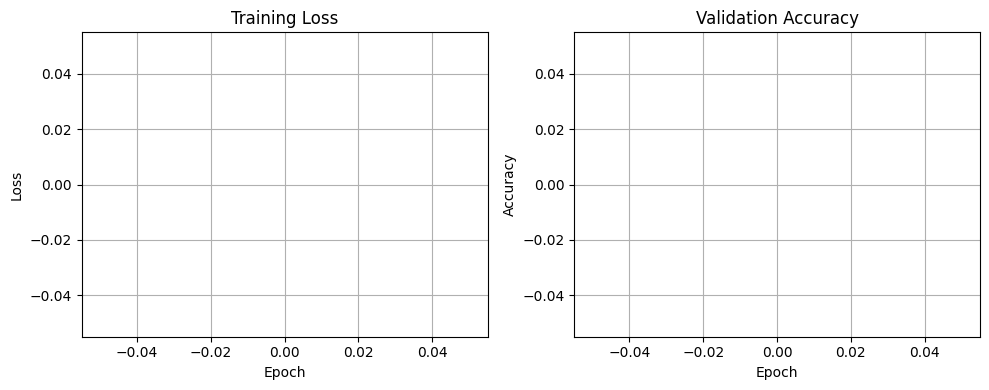

In [61]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.grid(True)

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label='Validation Accuracy', color='green')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.grid(True)

plt.tight_layout()
plt.show()


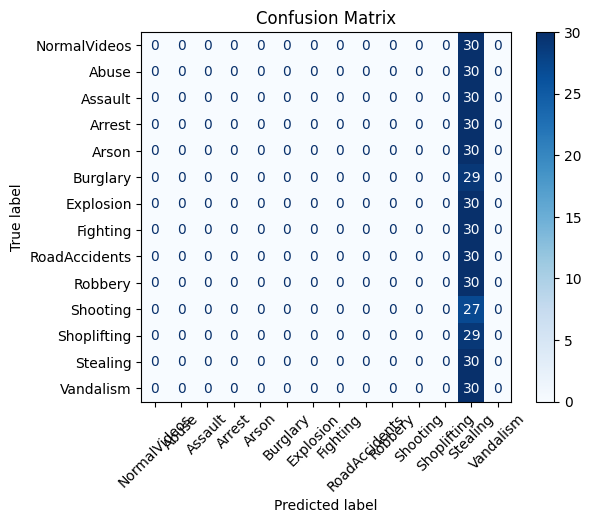

In [63]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def get_all_preds(model, loader, device):
    model.eval()
    preds = []
    targets = []

    val_loader = pl.MpDeviceLoader(loader, device)

    with torch.no_grad():
        for batch_x, batch_y in val_loader:
            output = model(batch_x)
            pred = output.argmax(dim=1)
            preds.extend(pred.cpu().numpy())
            targets.extend(batch_y.cpu().numpy())

    return preds, targets

preds, targets = get_all_preds(model, loader, device)

# Plot confusion matrix
cm = confusion_matrix(targets, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(xticks_rotation=45, cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

In [66]:
def evaluate(model, val_loader, device):
    model.eval()
    correct = 0
    total = 0
    val_loader = pl.MpDeviceLoader(val_loader, device)
    with torch.no_grad():
        for batch_x, batch_y in val_loader:
            output = model(batch_x)
            pred = output.argmax(dim=1)
            correct += (pred == batch_y).sum().item()
            total += batch_y.size(0)
    return correct / total

val_accuracy = evaluate(model, loader, device)  # Use your validation loader
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

Validation Accuracy: 7.23%


In [67]:
def show_predictions_for_batch(model, loader, device, class_names, num_videos=5):
    import matplotlib.pyplot as plt

    model.eval()

    # Get one batch
    batch_x, batch_y = next(iter(loader))
    batch_x, batch_y = batch_x.to(device), batch_y.to(device)

    # Predict
    with torch.no_grad():
        output = model(batch_x)
        preds = output.argmax(dim=1)

    # Plot first `num_videos` videos
    fig, axes = plt.subplots(num_videos, 5, figsize=(20, 4 * num_videos))

    for vid_idx in range(num_videos):
        video = batch_x[vid_idx].cpu()  # (T, C, H, W)
        true_label = batch_y[vid_idx].item()
        predicted_label = preds[vid_idx].item()

        for frame_idx in range(5):
            frame = video[frame_idx].permute(1, 2, 0).numpy()
            ax = axes[vid_idx, frame_idx]
            ax.imshow(frame)
            ax.axis('off')
            if frame_idx == 0:
                ax.set_title(f"True: {class_names[true_label]}\nPred: {class_names[predicted_label]}", fontsize=12)

    plt.tight_layout()
    plt.show()


IndexError: index 4 is out of bounds for dimension 0 with size 4

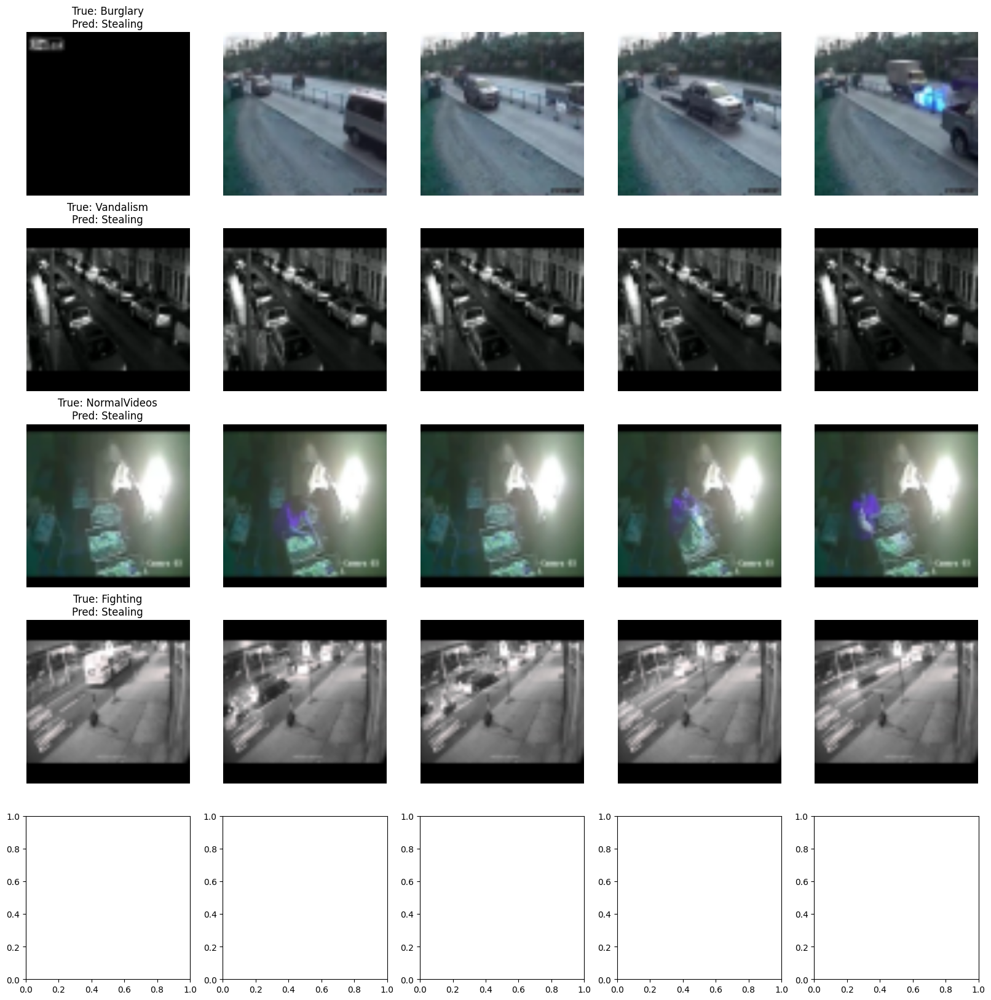

In [68]:
show_predictions_for_batch(model, loader, device=device, class_names=classes, num_videos=5)

# 2

In [69]:
import torch
import torch.nn as nn
import torchvision
import torch.nn.functional as F

class Enhanced_CNN_LSTM(nn.Module):
    def __init__(self, num_classes=14, embedding_dim=128, use_triplet=False):
        super().__init__()
        self.use_triplet = use_triplet
        
        # 1. Pretrained CNN Backbone (ResNet18)
        self.cnn = torchvision.models.resnet18(pretrained=True)
        self.cnn.fc = nn.Identity()  # Remove final layer
        
        # 2. LSTM with Attention
        self.lstm = nn.LSTM(
            input_size=512,  # ResNet18 output features
            hidden_size=256,
            batch_first=True,
            bidirectional=True
        )
        
        # Attention mechanism
        self.attention = nn.Sequential(
            nn.Linear(512, 128),  # 512 because bidirectional
            nn.Tanh(),
            nn.Linear(128, 1),
            nn.Softmax(dim=1)
        )
        
        # 3. Final layers (different for triplet vs classification)
        if use_triplet:
            self.fc = nn.Linear(512, embedding_dim)  # For triplet loss
        else:
            self.fc = nn.Sequential(
                nn.Linear(512, 256),
                nn.ReLU(),
                nn.Linear(256, num_classes)
            )

    def forward(self, x):
        # x shape: [B, T, C, H, W]
        B, T, C, H, W = x.shape
        
        # CNN feature extraction
        c_in = x.view(B * T, C, H, W)
        c_out = self.cnn(c_in)  # [B*T, 512]
        c_out = c_out.view(B, T, -1)  # [B, T, 512]
        
        # LSTM processing
        lstm_out, _ = self.lstm(c_out)  # [B, T, 512] (bidirectional)
        
        # Attention mechanism
        attention_weights = self.attention(lstm_out)  # [B, T, 1]
        context = torch.sum(attention_weights * lstm_out, dim=1)  # [B, 512]
        
        # Output
        if self.use_triplet:
            return self.fc(context)  # Return embeddings [B, embedding_dim]
        else:
            return self.fc(context)  # Return class scores [B, num_classes]

In [70]:
# Initialize model for triplet learning
model = Enhanced_CNN_LSTM(use_triplet=True).to(device)

# Define losses
triplet_loss = nn.TripletMarginLoss(margin=1.0)
classification_loss = nn.CrossEntropyLoss()

# Training loop
def train_triplet(model, loader, optimizer, device):
    model.train()
    para_loader = pl.MpDeviceLoader(loader, device)
    
    for batch_x, batch_y in para_loader:
        # For triplet loss, you need to prepare anchor/positive/negative samples
        # This is simplified - you'll need a proper triplet mining strategy
        anchors = model(batch_x)
        positives = model(batch_x)  # In practice, use different augmentations
        negatives = model(torch.roll(batch_x, shifts=1, dims=0))  # Negative samples
        
        optimizer.zero_grad()
        loss = triplet_loss(anchors, positives, negatives)
        loss.backward()
        xm.optimizer_step(optimizer)

/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 79.5MB/s]


In [71]:
# Initialize model for joint training
model = Enhanced_CNN_LSTM(use_triplet=False).to(device)

def train_joint(model, loader, optimizer, device, alpha=0.5):
    model.train()
    para_loader = pl.MpDeviceLoader(loader, device)
    
    for batch_x, batch_y in para_loader:
        # Get embeddings and class scores
        embeddings = model.cnn_lstm_part(batch_x)  # You'll need to modify forward
        class_scores = model.fc(anchors)
        
        # Triplet loss
        positives = model.cnn_lstm_part(batch_x)
        negatives = model.cnn_lstm_part(torch.roll(batch_x, 1, 0))
        triplet_loss = nn.TripletMarginLoss()(anchors, positives, negatives)
        
        # Classification loss
        class_loss = classification_loss(class_scores, batch_y)
        
        # Combined loss
        loss = alpha * triplet_loss + (1-alpha) * class_loss
        
        optimizer.zero_grad()
        loss.backward()
        xm.optimizer_step(optimizer)

In [72]:
import torch_xla.core.xla_model as xm
import torch_xla.distributed.parallel_loader as pl
from torch.optim.lr_scheduler import ReduceLROnPlateau

# 1. Initialize Model (Simplified version without triplet mining first)
model = Enhanced_CNN_LSTM(
    num_classes=14,
    embedding_dim=128,
    use_triplet=False  # Start with classification only
).to(device)

# 2. Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = ReduceLROnPlateau(optimizer, 'min', patience=2)

# 3. Fixed Training Loop (Classification only)
def train_epoch(model, loader, optimizer, device):
    model.train()
    para_loader = pl.MpDeviceLoader(loader, device)
    total_loss = 0.0
    
    for batch_x, batch_y in para_loader:
        optimizer.zero_grad()
        outputs = model(batch_x)
        loss = criterion(outputs, batch_y)
        loss.backward()
        xm.optimizer_step(optimizer)
        total_loss += loss.item()
    
    return total_loss / len(loader)

# 4. Evaluation Function
def evaluate(model, loader, device):
    model.eval()
    correct = 0
    total = 0
    val_loader = pl.MpDeviceLoader(loader, device)
    
    with torch.no_grad():
        for batch_x, batch_y in val_loader:
            outputs = model(batch_x)
            preds = outputs.argmax(dim=1)
            correct += (preds == batch_y).sum().item()
            total += batch_y.size(0)
    
    return correct / total

# 5. Main Training Loop
best_acc = 0.0
train_losses = []
val_accuracies = []

for epoch in range(10):
    train_loss = train_epoch(model, loader, optimizer, device)
    val_acc = evaluate(model, loader, device)
    
    scheduler.step(train_loss)

    train_losses.append(train_loss)
    val_accuracies.append(val_acc)

    if val_acc > best_acc:
        best_acc = val_acc
        xm.save(model.state_dict(), 'best_classifier.pth')

    print(f"Epoch {epoch+1}: Loss={train_loss:.4f}, Acc={val_acc:.2%}")


# 6. Save Final Model
xm.save(model.state_dict(), 'final_classifier.pth')

Epoch 1: Loss=2.5901, Acc=23.86%
Epoch 2: Loss=2.4008, Acc=34.94%
Epoch 3: Loss=2.1353, Acc=45.54%
Epoch 4: Loss=1.8556, Acc=64.82%
Epoch 5: Loss=1.5922, Acc=81.69%
Epoch 6: Loss=1.2531, Acc=87.23%
Epoch 7: Loss=0.9826, Acc=97.11%
Epoch 8: Loss=0.7070, Acc=96.39%
Epoch 9: Loss=0.5691, Acc=97.35%
Epoch 10: Loss=0.5368, Acc=97.83%


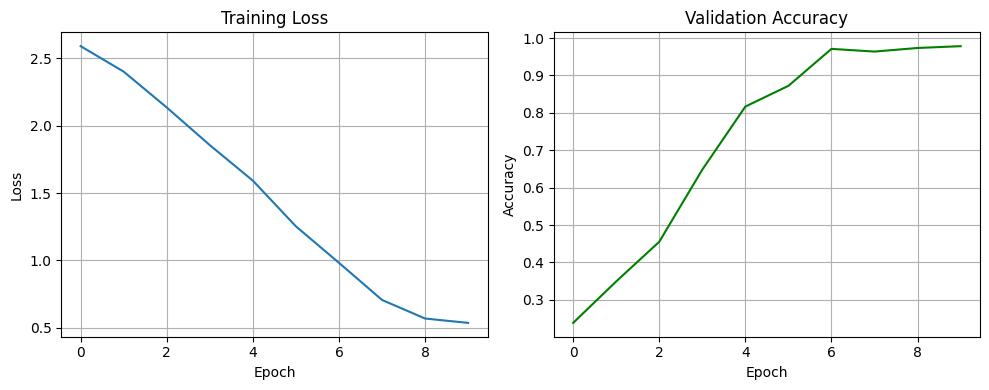

In [73]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.grid(True)

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label='Validation Accuracy', color='green')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.grid(True)

plt.tight_layout()
plt.show()

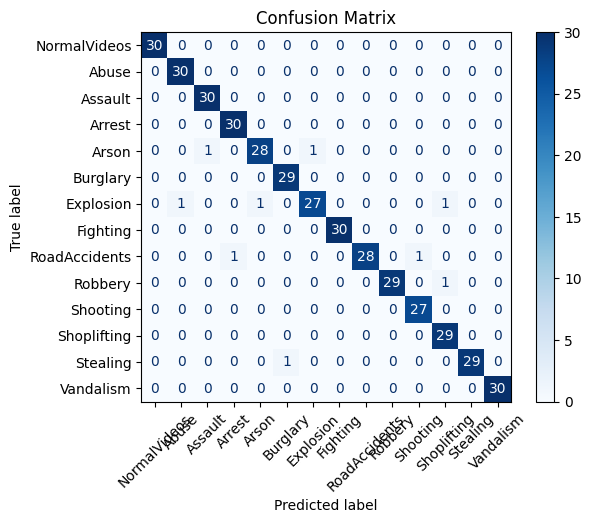

In [74]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def get_all_preds(model, loader, device):
    model.eval()
    preds = []
    targets = []

    val_loader = pl.MpDeviceLoader(loader, device)

    with torch.no_grad():
        for batch_x, batch_y in val_loader:
            output = model(batch_x)
            pred = output.argmax(dim=1)
            preds.extend(pred.cpu().numpy())
            targets.extend(batch_y.cpu().numpy())

    return preds, targets

preds, targets = get_all_preds(model, loader, device)

# Plot confusion matrix
cm = confusion_matrix(targets, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(xticks_rotation=45, cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

In [75]:
# Visualization of embeddings
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def plot_embeddings(model, loader, device):
    model.eval()
    embeddings, labels = [], []
    with torch.no_grad():
        for batch_x, batch_y in pl.MpDeviceLoader(loader, device):
            emb = model(batch_x).cpu()
            embeddings.append(emb)
            labels.append(batch_y.cpu())
    
    embeddings = torch.cat(embeddings).numpy()
    labels = torch.cat(labels).numpy()
    
    # Reduce dimensions
    tsne = TSNE(n_components=2)
    reduced = tsne.fit_transform(embeddings)
    
    # Plot
    plt.figure(figsize=(10,8))
    scatter = plt.scatter(reduced[:,0], reduced[:,1], c=labels, alpha=0.6)
    plt.legend(*scatter.legend_elements(), title="Classes")
    plt.show()

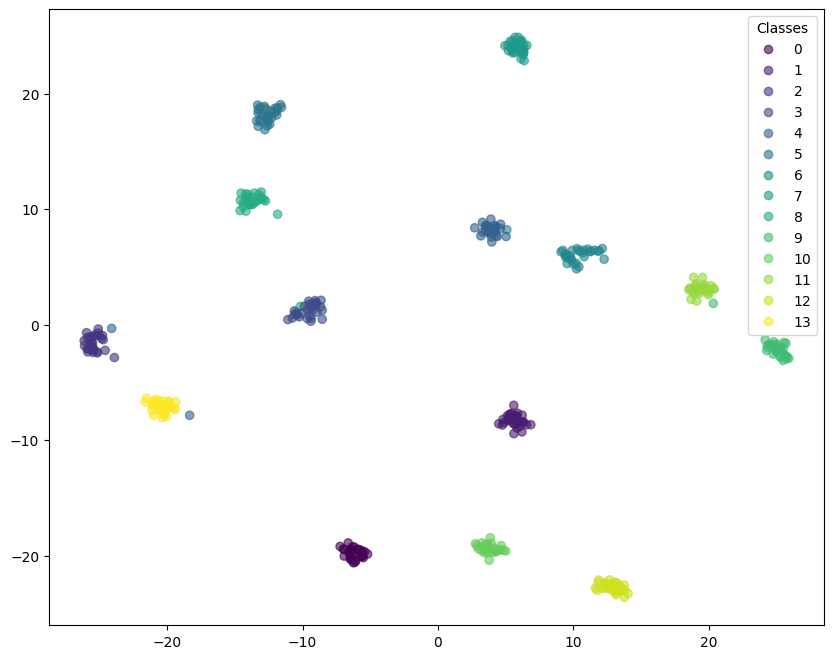

In [76]:
plot_embeddings(model, loader, device)

In [ ]:
show_predictions_for_batch(model, loader, device=device, class_names=classes, num_videos=5)

In [ ]:
# # During evaluation
# attention_weights = model.attention(lstm_out)
# print("Attention weights:", attention_weights[0].squeeze().cpu().numpy())

# 03

In [78]:
# Modified Triplet Training Function
def train_triplet_epoch(model, loader, optimizer, device, margin=1.0):
    model.train()
    para_loader = pl.MpDeviceLoader(loader, device)
    total_loss = 0.0
    
    for batch_x, batch_y in para_loader:
        # Get embeddings
        embeddings = model(batch_x)
        
        # Simple all-vs-all triplet mining (TPU compatible)
        optimizer.zero_grad()
        
        # Compute pairwise distances
        dist = torch.cdist(embeddings, embeddings, p=2)
        
        # For each sample, find hardest positive and negative
        with torch.no_grad():
            mask = batch_y.unsqueeze(0) == batch_y.unsqueeze(1)
            pos_mask = mask.fill_diagonal_(False)
            neg_mask = ~mask
            
            # Get hardest positive (furthest)
            pos_dist = dist * pos_mask.float()
            hardest_pos = pos_dist.argmax(dim=1)
            
            # Get hardest negative (closest)
            neg_dist = dist + 1e6 * (~neg_mask).float()  # Mask non-negatives
            hardest_neg = neg_dist.argmin(dim=1)
        
        # Compute triplet loss
        pos_dist = torch.norm(embeddings - embeddings[hardest_pos], dim=1)
        neg_dist = torch.norm(embeddings - embeddings[hardest_neg], dim=1)
        loss = F.relu(pos_dist - neg_dist + margin).mean()
        
        loss.backward()
        xm.optimizer_step(optimizer)
        total_loss += loss.item()
    
    return total_loss / len(loader)

In [79]:
import torch_xla.core.xla_model as xm
import torch_xla.distributed.parallel_loader as pl

# 1. Initialize Model (Simplified version without triplet mining first)
model = Enhanced_CNN_LSTM(
    num_classes=14,
    embedding_dim=128,
    use_triplet=True # Start with classification only
).to(device)

# 2. Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = ReduceLROnPlateau(optimizer, 'min', patience=2)

# 3. Fixed Training Loop (Classification only)
def train_epoch(model, loader, optimizer, device):
    model.train()
    para_loader = pl.MpDeviceLoader(loader, device)
    total_loss = 0.0
    
    for batch_x, batch_y in para_loader:
        optimizer.zero_grad()
        outputs = model(batch_x)
        loss = criterion(outputs, batch_y)
        loss.backward()
        xm.optimizer_step(optimizer)
        total_loss += loss.item()
    
    return total_loss / len(loader)

# 4. Evaluation Function
def evaluate(model, loader, device):
    model.eval()
    correct = 0
    total = 0
    val_loader = pl.MpDeviceLoader(loader, device)
    
    with torch.no_grad():
        for batch_x, batch_y in val_loader:
            outputs = model(batch_x)
            preds = outputs.argmax(dim=1)
            correct += (preds == batch_y).sum().item()
            total += batch_y.size(0)
    
    return correct / total

# 5. Main Training Loop
best_acc = 0.0
train_losses = []
val_accuracies = []
for epoch in range(10):
    # Train
    train_loss = train_epoch(model, loader, optimizer, device)
    
    # Evaluate
    val_acc = evaluate(model, loader, device)
    scheduler.step(train_loss)
    
    train_losses.append(train_loss)
    val_accuracies.append(val_acc)
    
    # Save best model
    if val_acc > best_acc:
        best_acc = val_acc
        xm.save(model.state_dict(), 'best_classifier_with_triplit.pth')
    
    print(f"Epoch {epoch+1}: Loss={train_loss:.4f}, Acc={val_acc:.2%}")

# 6. Save Final Model
xm.save(model.state_dict(), 'best_classifier_with_triplit.pth')

/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Loss=3.3726, Acc=28.92%
Epoch 2: Loss=2.4333, Acc=48.92%
Epoch 3: Loss=2.0288, Acc=56.14%
Epoch 4: Loss=1.6667, Acc=83.37%
Epoch 5: Loss=1.1098, Acc=91.08%
Epoch 6: Loss=0.7748, Acc=97.11%
Epoch 7: Loss=0.5113, Acc=96.39%
Epoch 8: Loss=0.4421, Acc=97.83%
Epoch 9: Loss=0.3564, Acc=98.31%
Epoch 10: Loss=0.2140, Acc=99.76%


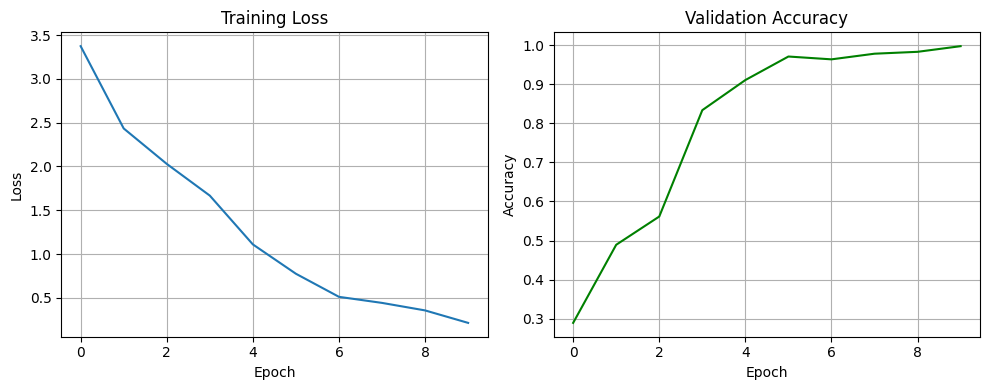

In [80]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.grid(True)

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label='Validation Accuracy', color='green')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.grid(True)

plt.tight_layout()
plt.show()

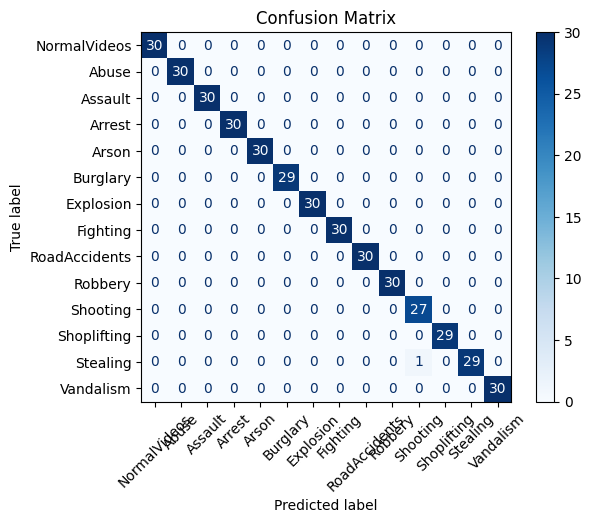

In [81]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def get_all_preds(model, loader, device):
    model.eval()
    preds = []
    targets = []

    val_loader = pl.MpDeviceLoader(loader, device)

    with torch.no_grad():
        for batch_x, batch_y in val_loader:
            output = model(batch_x)
            pred = output.argmax(dim=1)
            preds.extend(pred.cpu().numpy())
            targets.extend(batch_y.cpu().numpy())

    return preds, targets

preds, targets = get_all_preds(model, loader, device)

# Plot confusion matrix
cm = confusion_matrix(targets, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(xticks_rotation=45, cmap='Blues')
plt.title("Confusion Matrix")
plt.show()


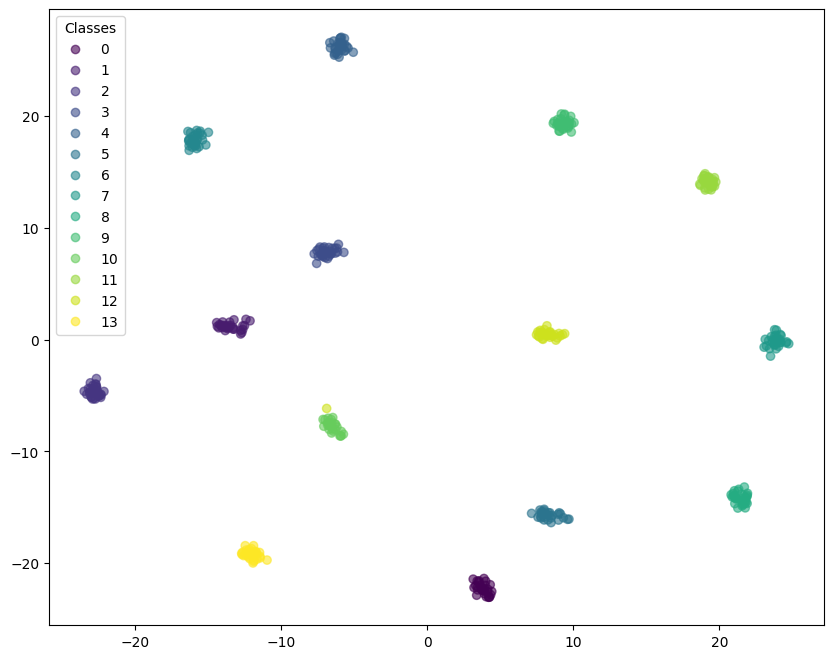

In [82]:
plot_embeddings(model, loader, device)

IndexError: index 4 is out of bounds for dimension 0 with size 4

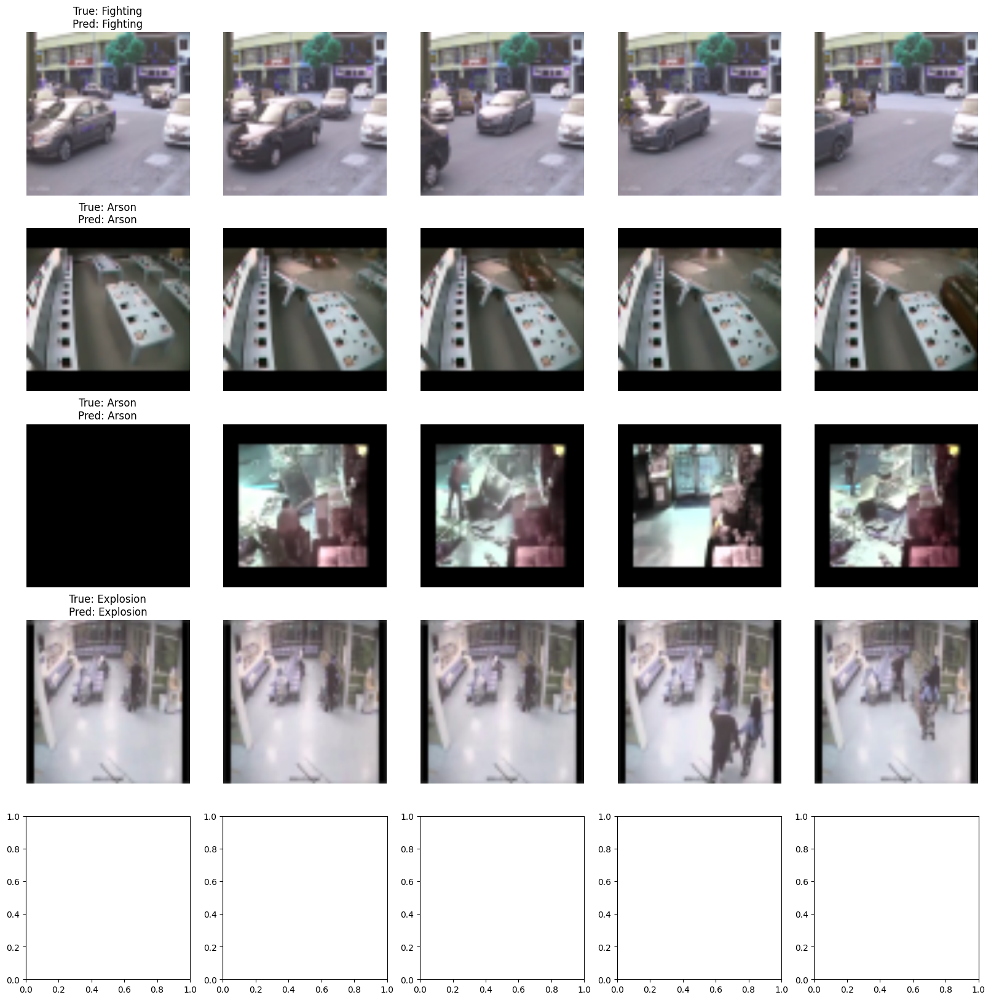

In [83]:
show_predictions_for_batch(model, loader, device=device, class_names=classes, num_videos=5)

# Video processing

In [41]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torchvision import transforms
from collections import defaultdict
import matplotlib.pyplot as plt

In [42]:
# Define model classes
class CNN_LSTM(nn.Module):
    def __init__(self, num_classes=14):
        super(CNN_LSTM, self).__init__()
        # CNN for spatial features
        self.cnn = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 224 -> 112
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 112 -> 56
            nn.Flatten()
        )
        
        # LSTM for temporal features
        self.lstm = nn.LSTM(
            input_size=64 * 56 * 56,
            hidden_size=128,
            batch_first=True
        )
        
        # Classifier
        self.fc = nn.Linear(128, num_classes)

    def forward(self, x):
        # x shape: [B, T, C, H, W]
        B, T, C, H, W = x.shape
        # Process frames through CNN
        c_in = x.view(B * T, C, H, W)
        c_out = self.cnn(c_in)          # [B*T, 64*56*56]
        r_in = c_out.view(B, T, -1)     # Unmerge for LSTM
        # Temporal modeling
        r_out, _ = self.lstm(r_in)      # [B, T, 128]
        # Classify using last timestep
        output = self.fc(r_out[:, -1, :])  # [B, num_classes]
        return output

class Enhanced_CNN_LSTM(nn.Module):
    def __init__(self, num_classes=14, embedding_dim=128, use_triplet=False):
        super(Enhanced_CNN_LSTM, self).__init__()
        self.use_triplet = use_triplet
        
        # Pretrained CNN Backbone (ResNet18)
        self.cnn = torchvision.models.resnet18(pretrained=True)
        self.cnn.fc = nn.Identity()  # Remove final layer
        
        # LSTM with Attention
        self.lstm = nn.LSTM(
            input_size=512,  # ResNet18 output features
            hidden_size=256,
            batch_first=True,
            bidirectional=True
        )
        
        # Attention mechanism
        self.attention = nn.Sequential(
            nn.Linear(512, 128),  # 512 because bidirectional
            nn.Tanh(),
            nn.Linear(128, 1),
            nn.Softmax(dim=1)
        )
        
        # Final layers (different for triplet vs classification)
        if use_triplet:
            self.fc = nn.Linear(512, embedding_dim)  # For triplet loss
        else:
            self.fc = nn.Sequential(
                nn.Linear(512, 256),
                nn.ReLU(),
                nn.Linear(256, num_classes)
            )

    def forward(self, x):
        # x shape: [B, T, C, H, W]
        B, T, C, H, W = x.shape
        
        # CNN feature extraction
        c_in = x.view(B * T, C, H, W)
        c_out = self.cnn(c_in)  # [B*T, 512]
        c_out = c_out.view(B, T, -1)  # [B, T, 512]
        
        # LSTM processing
        lstm_out, _ = self.lstm(c_out)  # [B, T, 512] (bidirectional)
        
        # Attention mechanism
        attention_weights = self.attention(lstm_out)  # [B, T, 1]
        context = torch.sum(attention_weights * lstm_out, dim=1)  # [B, 512]
        
        # Output
        if self.use_triplet:
            return self.fc(context)  # Return embeddings [B, embedding_dim]
        else:
            return self.fc(context)  # Return class scores [B, num_classes]

In [43]:
# Video processing functions
def extract_frames(video_path, output_dir, frame_interval=5):
    """Extract frames from video at specified intervals"""
    os.makedirs(output_dir, exist_ok=True)
    cap = cv2.VideoCapture(video_path)
    frame_count = 0
    saved_count = 0
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
            
        if frame_count % frame_interval == 0:
            frame_path = os.path.join(output_dir, f"frame_{saved_count:04d}.jpg")
            cv2.imwrite(frame_path, frame)
            saved_count += 1
            
        frame_count += 1
    
    cap.release()
    return saved_count

In [44]:
def preprocess_frames(frame_dir, num_samples=16):
    """Load and preprocess frames for model input"""
    frame_paths = sorted([os.path.join(frame_dir, f) for f in os.listdir(frame_dir) 
                         if f.endswith('.jpg')])
    
    if len(frame_paths) < num_samples:
        return None
    
    # Uniform sampling
    indices = np.linspace(0, len(frame_paths)-1, num_samples, dtype=int)
    sampled_paths = [frame_paths[i] for i in indices]
    
    # Load and resize frames
    frames = []
    for path in sampled_paths:
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224, 224))
        frames.append(img)
    
    # Convert to tensor
    frames = np.stack(frames) / 255.0  # (16, 224, 224, 3)
    frames = frames.transpose(0, 3, 1, 2)  # (16, 3, 224, 224)
    return torch.tensor(frames, dtype=torch.float32).unsqueeze(0)  # Add batch dim

In [45]:
def load_models(device):
    """Load all three trained models"""
    models = {}
    
    # # 1. Basic CNN-LSTM
    # model1 = CNN_LSTM(num_classes=14).to(device)
    # saved_dict = torch.load('/kaggle/input/ufc-crime-101/pytorch/default/1/final_classifier.pth', map_location=device)
    
    # # Filter out incompatible keys
    # model_dict = model1.state_dict()
    # # 1. Filter out unnecessary keys
    # saved_dict = {k: v for k, v in saved_dict.items() if k in model_dict}
    # # 2. Overwrite entries in the existing state dict
    # model_dict.update(saved_dict) 
    # # 3. Load the new state dict
    # model1.load_state_dict(model_dict, strict=False)
    # model1.eval()
    # models['basic'] = model1
    
    # 2. Enhanced CNN-LSTM (classification only)
    model2 = Enhanced_CNN_LSTM(num_classes=14, use_triplet=False).to(device)
    model2.load_state_dict(torch.load('/kaggle/input/ufc-crime-101/pytorch/default/1/best_classifier.pth', map_location=device))
    model2.eval()
    models['enhanced'] = model2
    
    # 3. Enhanced CNN-LSTM with triplet loss
    model3 = Enhanced_CNN_LSTM(num_classes=14, use_triplet=True).to(device)
    model3.load_state_dict(torch.load('/kaggle/input/ufc-crime-101/pytorch/default/1/best_classifier_with_triplit.pth', map_location=device))
    model3.eval()
    models['triplet'] = model3
    
    return models

In [46]:
def predict_video(video_path, models, device, temp_dir='temp_frames'):
    """Process video and get predictions from all models"""
    # Step 1: Extract frames
    print(f"Extracting frames from {video_path}...")
    num_frames = extract_frames(video_path, temp_dir)
    if num_frames < 16:
        print(f"Warning: Only {num_frames} frames extracted (minimum 16 required)")
        return None
    
    # Step 2: Preprocess frames
    print("Preprocessing frames...")
    input_tensor = preprocess_frames(temp_dir).to(device)
    
    # Step 3: Get predictions from all models
    predictions = {}
    classes = ["NormalVideos", "Abuse", "Assault", "Arrest", "Arson", "Burglary",
               "Explosion", "Fighting", "RoadAccidents", "Robbery", "Shooting",
               "Shoplifting", "Stealing", "Vandalism"]
    
    with torch.no_grad():
        # # Basic CNN-LSTM
        # basic_out = models['basic'](input_tensor)
        # basic_pred = torch.softmax(basic_out, dim=1).cpu().numpy()[0]
        # predictions['basic'] = {
        #     'class': classes[basic_pred.argmax()],
        #     'confidence': basic_pred.max(),
        #     'all_scores': basic_pred
        # }
        
        # Enhanced CNN-LSTM
        enhanced_out = models['enhanced'](input_tensor)
        enhanced_pred = torch.softmax(enhanced_out, dim=1).cpu().numpy()[0]
        predictions['enhanced'] = {
            'class': classes[enhanced_pred.argmax()],
            'confidence': enhanced_pred.max(),
            'all_scores': enhanced_pred
        }
        
        # Triplet model (if you want to use it for classification)
        triplet_out = models['triplet'](input_tensor)
        triplet_pred = torch.softmax(triplet_out, dim=1).cpu().numpy()[0]
        predictions['triplet'] = {
            'class': classes[triplet_pred.argmax()],
            'confidence': triplet_pred.max(),
            'all_scores': triplet_pred
        }
    
    # Cleanup temporary frames
    for f in os.listdir(temp_dir):
        os.remove(os.path.join(temp_dir, f))
    
    return predictions

In [47]:
def display_results(video_path, predictions):
    """Display the prediction results"""
    print(f"\nResults for video: {os.path.basename(video_path)}")
    print("-" * 50)
    
    for model_name, pred in predictions.items():
        print(f"{model_name.upper()} Model Prediction:")
        print(f"Class: {pred['class']}")
        print(f"Confidence: {pred['confidence']*100:.2f}%")
        
        # Show top 3 classes
        sorted_indices = np.argsort(pred['all_scores'])[::-1]
        print("Top predictions:")
        for i in range(3):
            idx = sorted_indices[i]
            print(f"  {classes[idx]}: {pred['all_scores'][idx]*100:.2f}%")
        print("-" * 50)

def visualize_predictions(video_path, predictions, num_frames=5):
    """Display sample frames with prediction results"""
    cap = cv2.VideoCapture(video_path)
    frames = []
    
    # Extract some frames
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_indices = np.linspace(0, total_frames-1, num_frames, dtype=int)
    
    for i in range(total_frames):
        ret, frame = cap.read()
        if not ret:
            break
        if i in frame_indices:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
    cap.release()
    
    # Create figure
    fig, axes = plt.subplots(1, len(frames), figsize=(20, 5))
    if len(frames) == 1:
        axes = [axes]
    
    for ax, frame in zip(axes, frames):
        ax.imshow(frame)
        ax.axis('off')
        
        # Add prediction info
        info = "Predictions:\n"
        for model_name, pred in predictions.items():
            info += f"{model_name}: {pred['class']} ({pred['confidence']*100:.1f}%)\n"
        ax.set_title(info)
    
    plt.tight_layout()
    plt.show()

Loading trained models...

Processing Arrest005_x264.mp4...
Extracting frames from /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-1/Arrest/Arrest005_x264.mp4...
Preprocessing frames...

Results for video: Arrest005_x264.mp4
--------------------------------------------------
ENHANCED Model Prediction:
Class: Shoplifting
Confidence: 75.69%
Top predictions:
  Shoplifting: 75.69%
  Robbery: 18.26%
  Explosion: 1.53%
--------------------------------------------------
TRIPLET Model Prediction:
Class: Shoplifting
Confidence: 94.33%
Top predictions:
  Shoplifting: 94.33%
  Fighting: 2.01%
  Robbery: 1.03%
--------------------------------------------------


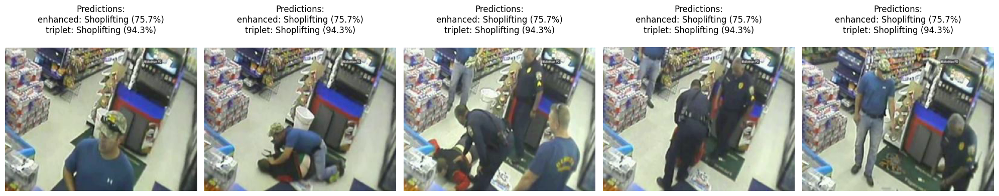

Results saved to /kaggle/working/results_Arrest005_x264.txt


In [51]:
# Main execution
if __name__ == "__main__":
    # Setup
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    classes = ["NormalVideos", "Abuse", "Assault", "Arrest", "Arson", "Burglary",
               "Explosion", "Fighting", "RoadAccidents", "Robbery", "Shooting",
               "Shoplifting", "Stealing", "Vandalism"]
    
    # Load models
    print("Loading trained models...")
    models = load_models(device)
    
    # Process videos
    video_path = "/kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-1/Arrest/Arrest005_x264.mp4"
    
    # Create temp directory in the writable area if needed by your predict_video function
    os.makedirs("/kaggle/working/temp_frames", exist_ok=True)
    
    print(f"\nProcessing {os.path.basename(video_path)}...")
    
    # Use your existing predict_video function
    predictions = predict_video(video_path, models, device)
    
    if predictions:
        display_results(video_path, predictions)
        visualize_predictions(video_path, predictions)
        
        # Save results to file in writable directory
        output_file = f"/kaggle/working/results_{os.path.splitext(os.path.basename(video_path))[0]}.txt"
        with open(output_file, "w") as f:
            f.write(f"Results for video: {os.path.basename(video_path)}\n")
            for model_name, pred in predictions.items():
                f.write(f"{model_name.upper()} Model Prediction:\n")
                f.write(f"Class: {pred['class']}\n")
                f.write(f"Confidence: {pred['confidence']*100:.2f}%\n")
                f.write("Top predictions:\n")
                sorted_indices = np.argsort(pred['all_scores'])[::-1]
                for i in range(3):
                    idx = sorted_indices[i]
                    f.write(f"  {classes[idx]}: {pred['all_scores'][idx]*100:.2f}%\n")
                f.write("-" * 50 + "\n")
        print(f"Results saved to {output_file}")

Loading trained models...



Enter video path (or type 'exit' to quit):  /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Normal-Videos-Part-1/Normal_Videos_003_x264.mp4



Processing Normal_Videos_003_x264.mp4...
Extracting frames from /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Normal-Videos-Part-1/Normal_Videos_003_x264.mp4...
Preprocessing frames...

Results for video: Normal_Videos_003_x264.mp4
--------------------------------------------------
ENHANCED Model Prediction:
Class: Assault
Confidence: 64.93%
Top predictions:
  Assault: 64.93%
  NormalVideos: 17.70%
  Arson: 7.17%
--------------------------------------------------
TRIPLET Model Prediction:
Class: Fighting
Confidence: 37.49%
Top predictions:
  Fighting: 37.49%
  Vandalism: 21.09%
  Shoplifting: 14.82%
--------------------------------------------------


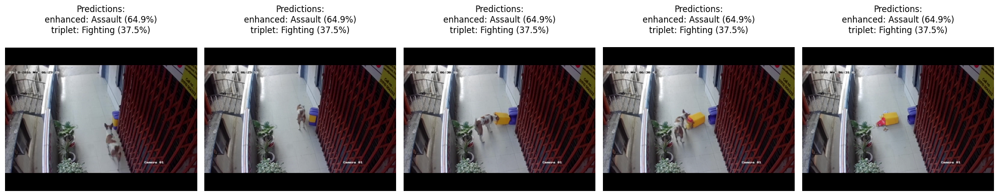

Results saved to /kaggle/working/results_Normal_Videos_003_x264.txt



Enter video path (or type 'exit' to quit):  /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-2/Fighting/Fighting008_x264.mp4



Processing Fighting008_x264.mp4...
Extracting frames from /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-2/Fighting/Fighting008_x264.mp4...
Preprocessing frames...

Results for video: Fighting008_x264.mp4
--------------------------------------------------
ENHANCED Model Prediction:
Class: Assault
Confidence: 28.58%
Top predictions:
  Assault: 28.58%
  Arson: 23.01%
  Explosion: 20.73%
--------------------------------------------------
TRIPLET Model Prediction:
Class: Vandalism
Confidence: 38.76%
Top predictions:
  Vandalism: 38.76%
  Explosion: 29.13%
  Arson: 6.00%
--------------------------------------------------


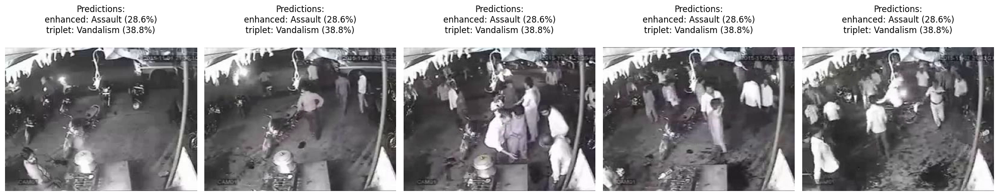

Results saved to /kaggle/working/results_Fighting008_x264.txt



Enter video path (or type 'exit' to quit):  /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-2/Explosion/Explosion001_x264.mp4



Processing Explosion001_x264.mp4...
Extracting frames from /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-2/Explosion/Explosion001_x264.mp4...
Preprocessing frames...

Results for video: Explosion001_x264.mp4
--------------------------------------------------
ENHANCED Model Prediction:
Class: Assault
Confidence: 44.92%
Top predictions:
  Assault: 44.92%
  Burglary: 31.88%
  NormalVideos: 8.40%
--------------------------------------------------
TRIPLET Model Prediction:
Class: Burglary
Confidence: 43.94%
Top predictions:
  Burglary: 43.94%
  Assault: 37.69%
  NormalVideos: 5.13%
--------------------------------------------------


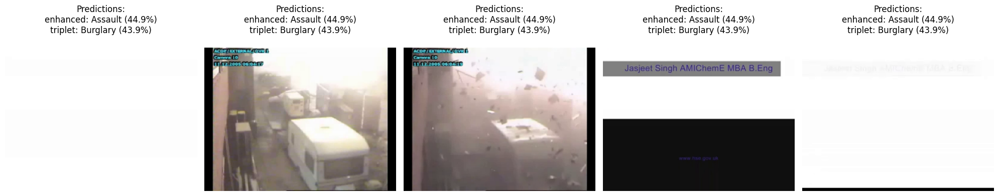

Results saved to /kaggle/working/results_Explosion001_x264.txt



Enter video path (or type 'exit' to quit):  /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-2/Explosion/Explosion006_x264.mp4



Processing Explosion006_x264.mp4...
Extracting frames from /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-2/Explosion/Explosion006_x264.mp4...
Preprocessing frames...

Results for video: Explosion006_x264.mp4
--------------------------------------------------
ENHANCED Model Prediction:
Class: Vandalism
Confidence: 68.49%
Top predictions:
  Vandalism: 68.49%
  Burglary: 14.51%
  NormalVideos: 6.91%
--------------------------------------------------
TRIPLET Model Prediction:
Class: Vandalism
Confidence: 66.33%
Top predictions:
  Vandalism: 66.33%
  Burglary: 9.30%
  RoadAccidents: 5.60%
--------------------------------------------------


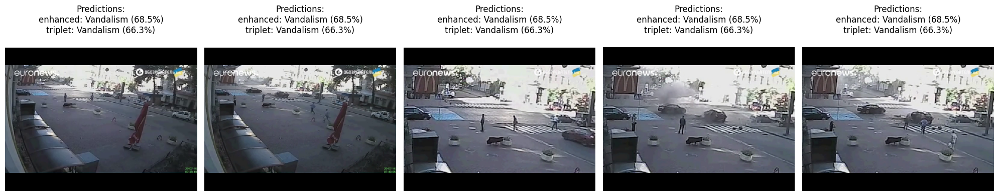

Results saved to /kaggle/working/results_Explosion006_x264.txt



Enter video path (or type 'exit' to quit):  /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-1/Arrest/Arrest001_x264.mp4



Processing Arrest001_x264.mp4...
Extracting frames from /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-1/Arrest/Arrest001_x264.mp4...
Preprocessing frames...

Results for video: Arrest001_x264.mp4
--------------------------------------------------
ENHANCED Model Prediction:
Class: NormalVideos
Confidence: 44.20%
Top predictions:
  NormalVideos: 44.20%
  Assault: 42.39%
  Vandalism: 3.69%
--------------------------------------------------
TRIPLET Model Prediction:
Class: NormalVideos
Confidence: 87.23%
Top predictions:
  NormalVideos: 87.23%
  Vandalism: 6.55%
  Assault: 2.49%
--------------------------------------------------


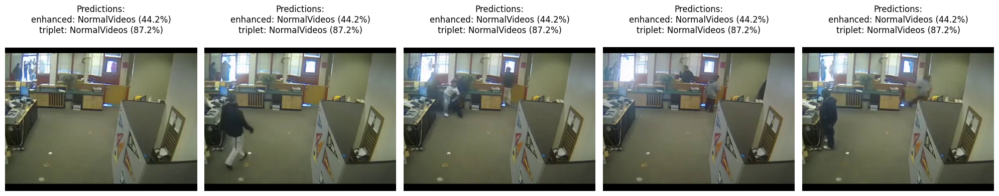

Results saved to /kaggle/working/results_Arrest001_x264.txt



Enter video path (or type 'exit' to quit):  /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-1/Arrest/Arrest001_x264.mp4



Processing Arrest001_x264.mp4...
Extracting frames from /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-1/Arrest/Arrest001_x264.mp4...
Preprocessing frames...

Results for video: Arrest001_x264.mp4
--------------------------------------------------
ENHANCED Model Prediction:
Class: NormalVideos
Confidence: 44.20%
Top predictions:
  NormalVideos: 44.20%
  Assault: 42.39%
  Vandalism: 3.69%
--------------------------------------------------
TRIPLET Model Prediction:
Class: NormalVideos
Confidence: 87.23%
Top predictions:
  NormalVideos: 87.23%
  Vandalism: 6.55%
  Assault: 2.49%
--------------------------------------------------


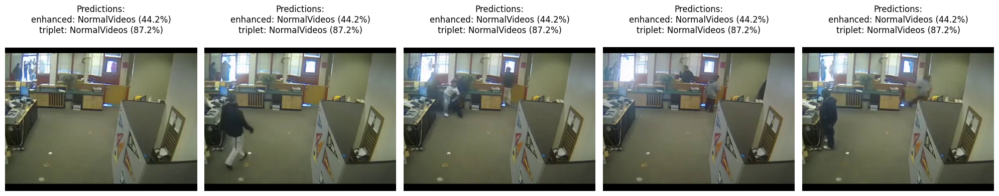

Results saved to /kaggle/working/results_Arrest001_x264.txt



Enter video path (or type 'exit' to quit):  /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-1/Abuse/Abuse026_x264.mp4



Processing Abuse026_x264.mp4...
Extracting frames from /kaggle/input/crimeucfdataset/Anomaly_Dataset/Anomaly_Videos/Anomaly-Videos-Part-1/Abuse/Abuse026_x264.mp4...
Preprocessing frames...

Results for video: Abuse026_x264.mp4
--------------------------------------------------
ENHANCED Model Prediction:
Class: NormalVideos
Confidence: 96.49%
Top predictions:
  NormalVideos: 96.49%
  Abuse: 1.35%
  Vandalism: 0.54%
--------------------------------------------------
TRIPLET Model Prediction:
Class: NormalVideos
Confidence: 92.22%
Top predictions:
  NormalVideos: 92.22%
  Vandalism: 4.88%
  Explosion: 0.52%
--------------------------------------------------


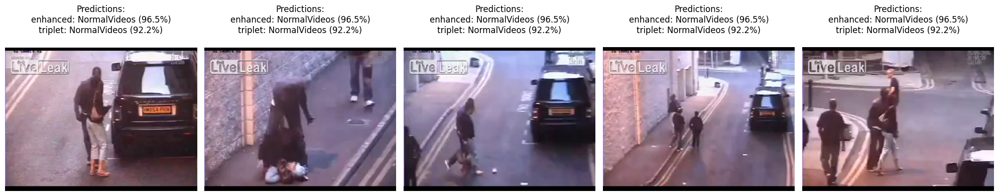

Results saved to /kaggle/working/results_Abuse026_x264.txt


In [ ]:
import os
import torch
import numpy as np

# Your assumed utility functions (already implemented elsewhere)
# from your_module import load_models, predict_video, display_results, visualize_predictions

if __name__ == "__main__":
    # Setup
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    classes = ["NormalVideos", "Abuse", "Assault", "Arrest", "Arson", "Burglary",
               "Explosion", "Fighting", "RoadAccidents", "Robbery", "Shooting",
               "Shoplifting", "Stealing", "Vandalism"]

    # Load models once
    print("Loading trained models...")
    models = load_models(device)

    # Create temp directory
    os.makedirs("/kaggle/working/temp_frames", exist_ok=True)

    while True:
        # Get video path from user
        video_path = input("\nEnter video path (or type 'exit' to quit): ").strip()
        if video_path.lower() == 'exit':
            print("Exiting.")
            break
        if not os.path.isfile(video_path):
            print("Invalid path. Please try again.")
            continue

        print(f"\nProcessing {os.path.basename(video_path)}...")

        # Predict
        predictions = predict_video(video_path, models, device)

        if predictions:
            display_results(video_path, predictions)
            visualize_predictions(video_path, predictions)

            # Save to output
            output_file = f"/kaggle/working/results_{os.path.splitext(os.path.basename(video_path))[0]}.txt"
            with open(output_file, "w") as f:
                f.write(f"Results for video: {os.path.basename(video_path)}\n")
                for model_name, pred in predictions.items():
                    f.write(f"{model_name.upper()} Model Prediction:\n")
                    f.write(f"Class: {pred['class']}\n")
                    f.write(f"Confidence: {pred['confidence']*100:.2f}%\n")
                    f.write("Top predictions:\n")
                    sorted_indices = np.argsort(pred['all_scores'])[::-1]
                    for i in range(3):
                        idx = sorted_indices[i]
                        f.write(f"  {classes[idx]}: {pred['all_scores'][idx]*100:.2f}%\n")
                    f.write("-" * 50 + "\n")
            print(f"Results saved to {output_file}")
